In [363]:
import plotly.express as px
import pandas as pd
import re
import numpy as np
import matplotlib
import matplotlib.pyplot as plt


In [364]:
output_txt = "../output.txt"

In [365]:
f = open(output_txt, "r")
content = f.read()

In [366]:
#estos regex encuentran los bloques con soluciones greedy o heuristicas delimitadas
regex_greedy_sols =  re.compile(r"---\n(.*\n)*?---\n")
regex_greedy_quality = re.compile(r"PERIOD (.*?) GREEDY SOLUTION WITH QUALITY (.*?)\n")
regex_heuristic_sols = re.compile(r"===\n(.*\n)*?===\n")
regex_heuristic_quality = re.compile(r"PERIOD (.*?) HEURISTIC SOLUTION WITH QUALITY (.*?)\n")

In [367]:
regex_assignment = re.compile(
    r"V(.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?\(.*?\))    (.*?\(.*?\))    (.*?\(.*?\))    (.*?\(.*?\))"
)

In [368]:
periods = content.split("CURRENT PERIOD")[1:]

In [369]:
q_list = []
count = 1
final_d = {}
dataframes = []
for p in periods:
    g_sol = p.split('---')[1]
    g_quality = float(re.findall(regex_greedy_quality, g_sol)[0][1])
    try:
        h_sol = p.split('===')[1]
        h_quality = float(re.findall(regex_heuristic_quality, h_sol)[0][1])
        q_list.append([count,g_quality, h_quality, ((g_quality-h_quality)/g_quality)*100])
    except:
        q_list.append([count,g_quality, 0, 0])
    matches = re.findall(regex_assignment, g_sol)
    aux = []
    final_d = {}
    for match in matches:
        d = {}
        d["P"] = count
        d["Victim"] = "V" + str(match[0])
        d["G"] = int(match[1])
        d["A"] = int(match[2])
        d["λ"] = float(match[3])
        d["Veh"] = match[5]
        d["Hos"] = match[7]
        d["App"] = float(match[8].split(" ")[0])
        d["S"] = float(match[9].split(" ")[0])
        d["F"] =float(match[-1].split(" ")[0])
        d["Dur"] = d["F"] - d["App"]
        d["Wait"] = d["S"] - d["App"]
        d["TS_S"] = match[9].split(" ")[1].strip("(").strip(")")
        d["TS_F"] = match[-1].split(" ")[1].strip("(").strip(")")
        aux.append(d)
        final_d["V" + str(match[0])] = d
    p_df = pd.DataFrame(aux)
    dataframes.append(p_df)
    count += 1

df_calidades = pd.DataFrame(q_list, columns=["Periodo", "Calidad Greedy", "Calidad Post-Heuristica", "\\% de Diferencia"])

### Diferencias de calidades entre solucion greedy y heuristica

In [370]:
df_calidades

,Periodo,Calidad Greedy,Calidad Post-Heuristica,\% de Diferencia
0,1,15136.7,14789.6,2.293102
1,2,28006.2,27926.5,0.284580
2,3,40618.4,40475.7,0.351319
3,4,48295.8,47790.4,1.046468
4,5,50365.5,50255.4,0.218602
5,6,44576.7,44286.4,0.651237
6,7,41790.0,41790.0,0.000000


### Gantt por periodo

In [247]:
def drawGantt(name, period_df, fig_x, fig_y, draw_bars=False):
    plt.figure(figsize=(fig_x, fig_y))
    yticks = [i for i in range(len(period_df.Victim))]
    plt.title(name, size=18)

    for i in range(period_df.shape[0]):
        plt.barh(y=period_df.Victim.iloc[i], left=period_df.App.iloc[i], width=period_df.Dur.iloc[i], alpha=0.4, color='green')
        plt.barh(y=period_df.Victim.iloc[i], left=period_df.App.iloc[i], width=period_df.Wait.iloc[i], alpha=1, color='gray')
        label = (
            str(period_df.λ.iloc[i]) + " (" + str(period_df.Victim.iloc[i]) + " G=" + str(period_df.G.iloc[i]) +
            " A=" + str(period_df.A.iloc[i]) + ")" + "     Start: " + str(period_df.TS_S.iloc[i]) +
            ",  Finish: " + str(period_df.TS_F.iloc[i])
        )
        label += "  Wait: " + str("{:.3f}".format(period_df.Wait.iloc[i]))
        label += " | Vehicle: " + str(period_df.Veh.iloc[i]) + " " + period_df.Hos.iloc[i]
        plt.text(x=period_df.F.iloc[i] + 18, y=yticks[i], s=label)

    if draw_bars:
        plt.axvline(x=461, color='b')
        plt.axvline(x=566, color='b')
        plt.axvline(x=706, color='b')
        plt.axvline(x=806, color='b')
        plt.axvline(x=936, color='b')
        plt.axvline(x=1096, color='b')
        plt.axvline(x=1176, color='b')
    
    plt.grid(axis='x')
    plt.gca().invert_yaxis()
    plt.show()


#### Periodo 1



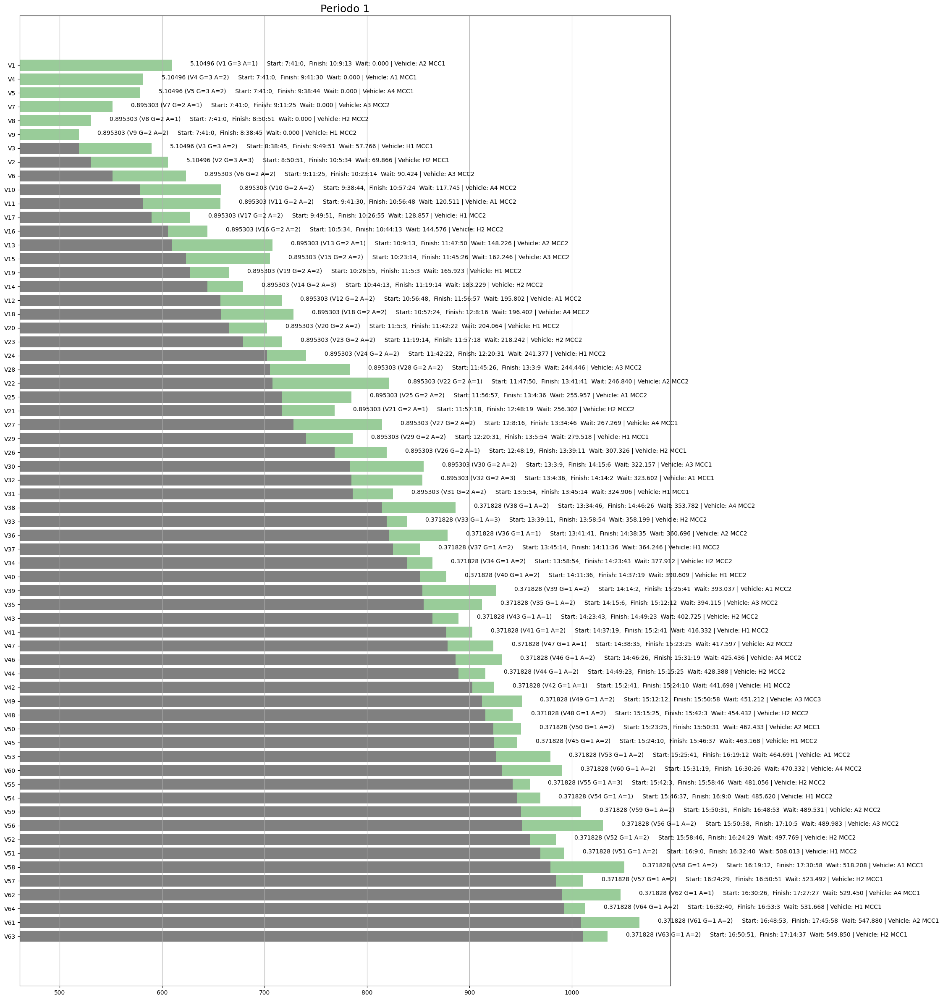

In [248]:
drawGantt("Periodo 1", dataframes[0].sort_values(by='S'),20, 30)


##### Por vehiculo

#### Periodo 2

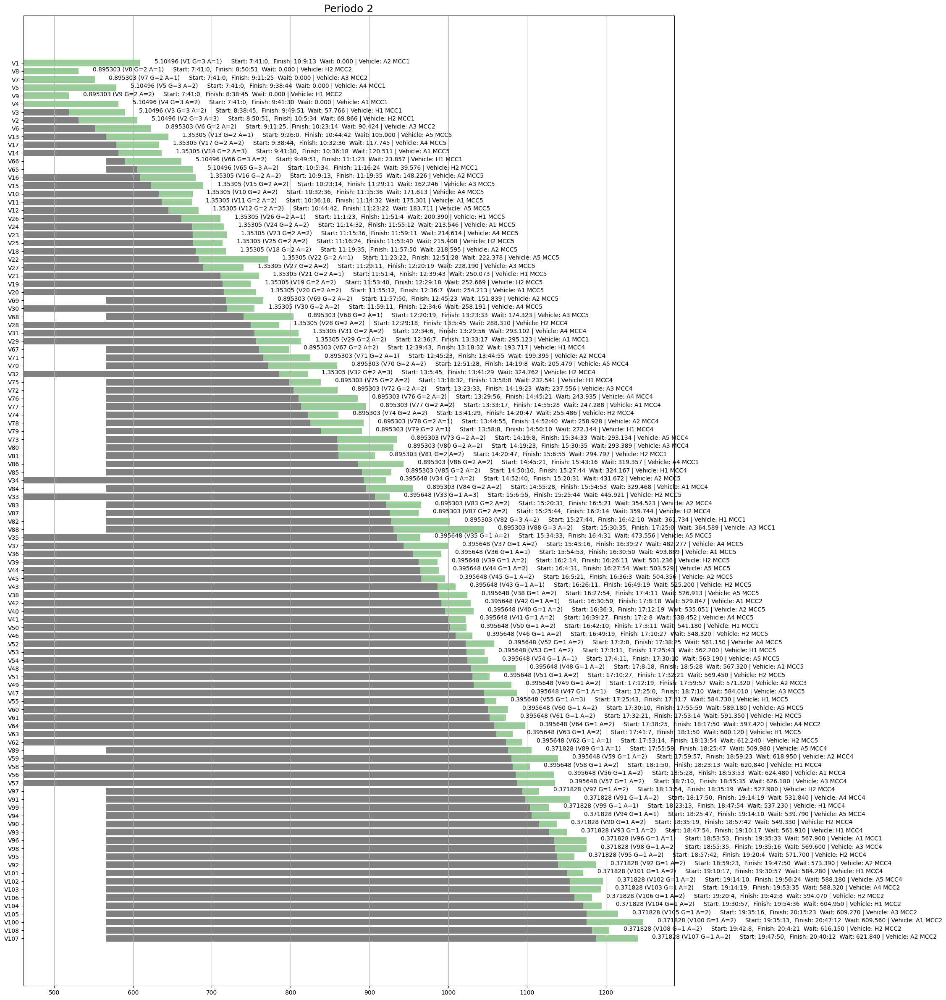

In [249]:
drawGantt("Periodo 2", dataframes[1].sort_values(by='S'),20, 30)


#### Periodo 3

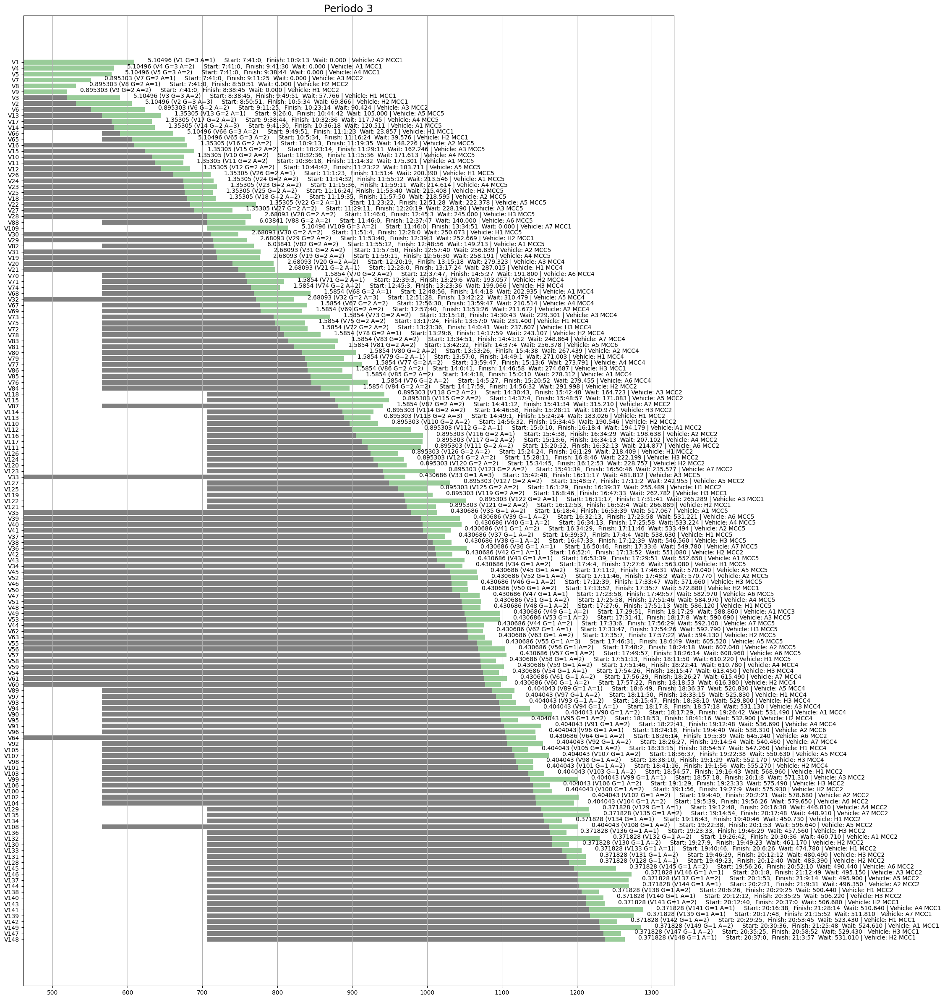

In [250]:
drawGantt("Periodo 3", dataframes[2].sort_values(by='S'),20, 30)

#### Periodo 4

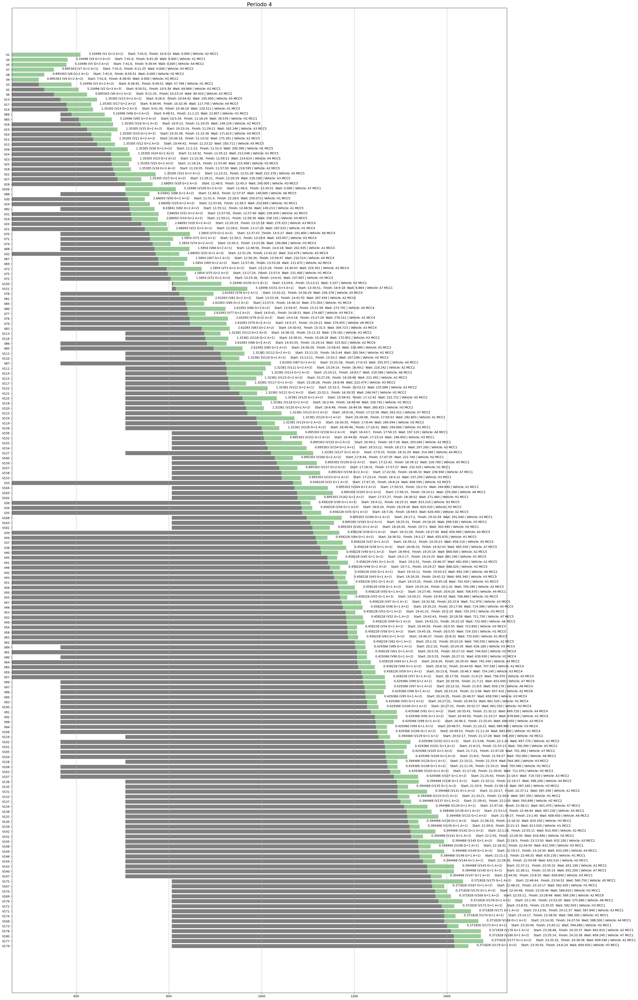

In [251]:
drawGantt("Periodo 4", dataframes[3].sort_values(by='S'),30, 60)

#### Periodo 5

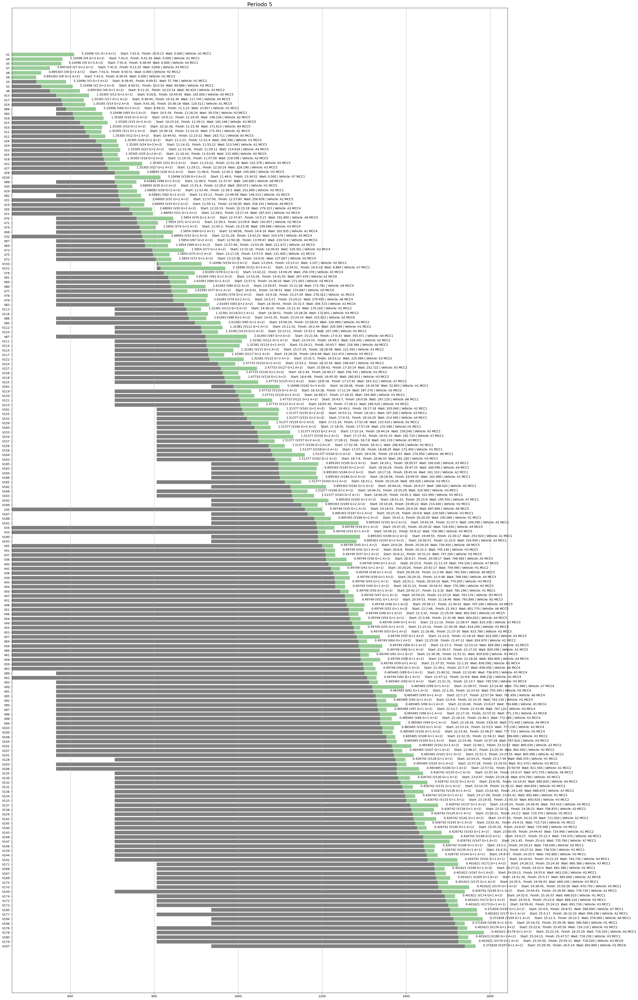

In [252]:
drawGantt("Periodo 5", dataframes[4].sort_values(by='S'),30, 60)

#### Periodo 6

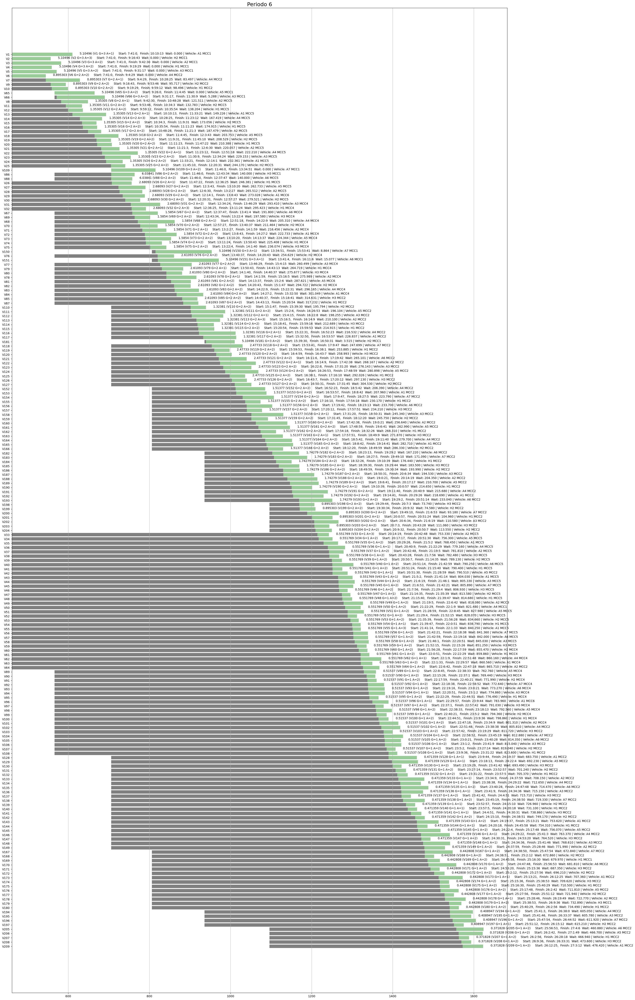

In [372]:
drawGantt("Periodo 6", dataframes[5].sort_values(by='S'),30, 60)

#### Periodo 7

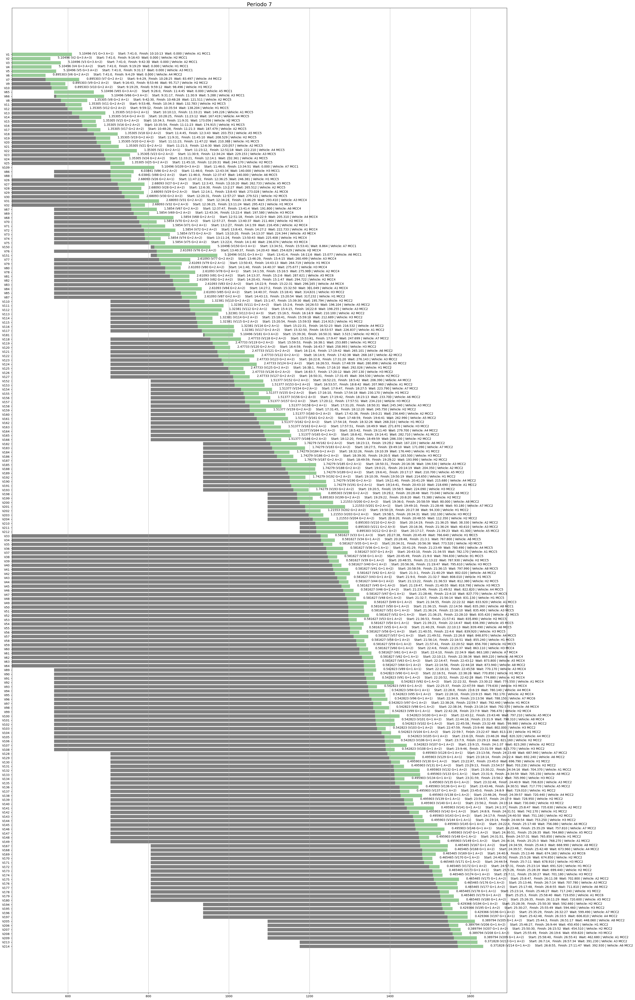

In [371]:
drawGantt("Periodo 7", dataframes[6].sort_values(by='S'),30, 60)